# ResolVI to address noise and biases in spatial transcriptomics
In this tutorial, we go through the steps of training resolVI for correction in cellular-resolved spatial transcriptomics. This addresses erroneous co-expression pattern after cellular segmentation as well as unspecific background in these technologies. We highly recommend to optimize cell segmentation before running resolVI as a better cell segmentation will also yield better downstream results and both steps are complementary.

Plan for this tutorial:

1. Loading the data
2. Training an unsupervised and (semi-)supervised resolVI model
3. Visualizing the latent space
4. Transfer mapping.
5. Generating corrected counts and perform DE analysis

In [1]:
# Install tutorial dependencies
!pip install --quiet "scviva-tools[tutorials]" decoupler scib-rapids adjustText



[notice] A new release of pip is available: 24.3.1 -> 26.1.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import os
os.environ.setdefault("NUMBA_CACHE_DIR", "/tmp/numba")
import tempfile
import time
import decoupler as dc
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
import scviva
import rapids_singlecell as rsc
start = time.perf_counter()

sc.set_figure_params(figsize=(4, 4))
save_dir = tempfile.TemporaryDirectory()
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

scviva.settings.seed = 0
print("Last run with scviva-tools version:", scviva.__version__)

Seed set to 0


Last run with scviva-tools version: 0.1.0


## Data Loading

For the purposes of this notebook, we will be loading a Xenium dataset of a mouse brain. We will use the left hemisphere for model training and the right hemisphere for transfer mapping.
The data was originally labeled using Leiden clustering of an optimized segmentation using the [ProSeg](https://www.biorxiv.org/content/10.1101/2024.04.25.591218v1) algorithm, which is a scalable algorithm for transcriptome-informed segmentation.

In [3]:
adata_path = os.path.join(save_dir.name, "tutorial_xenium_brain.h5ad")
adata = sc.read(
    adata_path, backup_url="https://exampledata.scverse.org/scvi-tools/tutorial_xenium_brain.h5ad"
)
adata

  0%|          | 0.00/170M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 130604 × 248
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'fov', 'predicted_celltype'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'log1p'
    obsm: 'X_resolvi_transferred', 'X_spatial', 'X_umap_transferred'
    layers: 'counts'

We computed a UMAP after transfering labels using the ProSeg segmented dataset and the UMAP serves as ground truth.

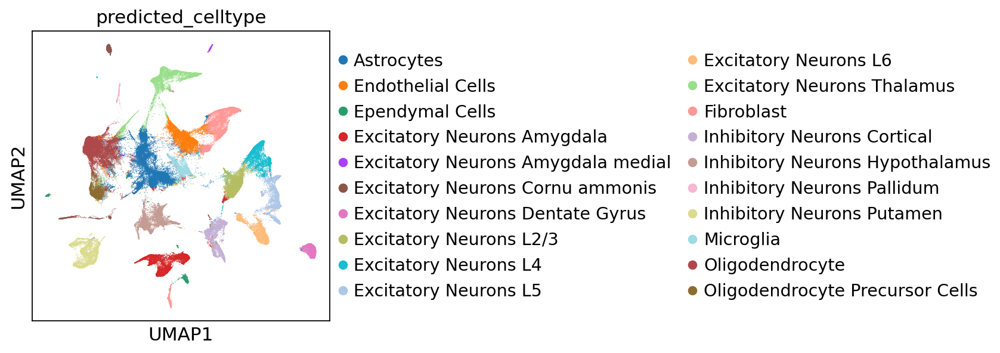

/tmp/ipykernel_1921283/1077018278.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="predicted_celltype", spot_size=30)


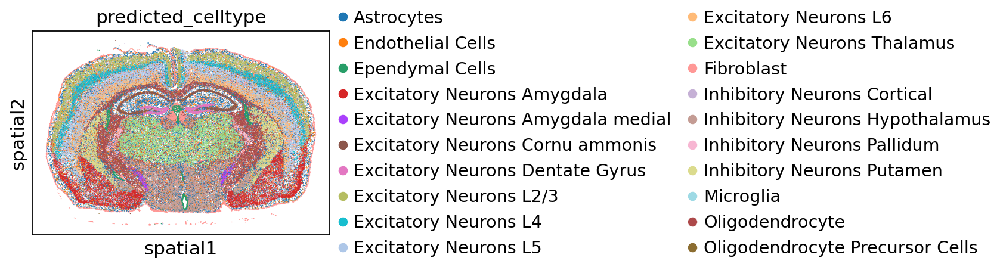

In [4]:
adata.obsm["X_umap"] = adata.obsm["X_umap_transferred"]
sc.pl.umap(adata, color="predicted_celltype")
sc.pl.spatial(adata, color="predicted_celltype", spot_size=30)

In [5]:
adata.obs["predicted_celltype"].value_counts()

predicted_celltype
Astrocytes                            17315
Oligodendrocyte                       14567
Fibroblast                            10070
Endothelial Cells                      9775
Inhibitory Neurons Hypothalamus        9284
Excitatory Neurons Amygdala            8640
Excitatory Neurons Thalamus            7947
Excitatory Neurons L5                  7004
Excitatory Neurons L2/3                6393
Inhibitory Neurons Putamen             5753
Inhibitory Neurons Cortical            5711
Excitatory Neurons L4                  5500
Excitatory Neurons L6                  5052
Microglia                              4141
Oligodendrocyte Precursor Cells        3872
Excitatory Neurons Dentate Gyrus       3283
Excitatory Neurons Cornu ammonis       2787
Ependymal Cells                        2202
Inhibitory Neurons Pallidum             658
Excitatory Neurons Amygdala medial      650
Name: count, dtype: int64

We use this dataset to set up a semisupervised and an unsupervised model in resolVI and train these. We split the dataset into right and left hemisphere to demonstrate query mapping.

/tmp/ipykernel_1921283/1090802531.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="hemisphere", spot_size=30)
... storing 'hemisphere' as categorical


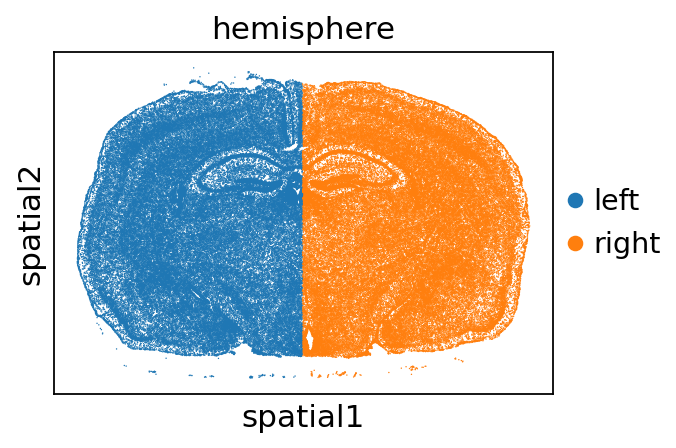

In [6]:
adata.obs["hemisphere"] = ["right" if x > 5000 else "left" for x in adata.obsm["X_spatial"][:, 0]]
sc.pl.spatial(adata, color="hemisphere", spot_size=30)

In [7]:
ref_adata = adata[adata.obs["hemisphere"] == "left"].copy()
query_adata = adata[adata.obs["hemisphere"] == "right"].copy()

## Train resolVI model

As in the scANVI notebook, we need to register the AnnData object for use in resolVI. Namely, we can ignore the batch parameter because those cells don't have much batch effect to begin with as they are derived from a single slice. However, we will give the celltype labels for resolVI to use. Setting up AnnData computes spatial neighbors within each batch. This step might take minutes for very large datasets. It is important that different slices are used as batch covariate.

In [8]:
from scviva.model._resolvi import ResolVI

In [9]:
scviva.model.ResolVI.setup_anndata(ref_adata, labels_key="predicted_celltype", layer="counts")

INFO     Generating sequential column names                                                                        
INFO     Generating sequential column names                                                                        


/home/access/miniconda3/lib/python3.13/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(


In [10]:
supervised_resolvi = scviva.model.ResolVI(ref_adata, semisupervised=True)

We use here only 50 epochs to speed up running the tutorial. We would recommend using 100 epochs here.

**Graph DataLoader (default):**  `ResolVI` now trains with `GraphDataSplitter` by default, returning `torch_geometric.data.Data` mini-batches containing `edge_index` and `edge_attr` (neighbor distances) alongside the usual expression tensors. You can explicitly set the neighbor index key and enable the model-side neighbor expression cache (reduces per-batch CPU-to-GPU transfer) via `cache_neighbor_expression='auto'`.


In [11]:
supervised_resolvi.train(
    max_epochs=50,
    # GraphDataSplitter needs to know which obsm key holds neighbor indices
    datasplitter_kwargs={"neighbor_indices_key": "index_neighbor"},
    # 'auto': enable dense neighbor-expression cache when <1 GB; avoids per-batch AnnTorchDataset reads
    cache_neighbor_expression="auto",
)


Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
/home/access/miniconda3/lib/python3.13/site-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
You are using a CUDA device ('NVIDIA GeForce RTX 4090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for perfor

Training:   0%|          | 0/50 [00:00<?, ?it/s]

/home/access/miniconda3/lib/python3.13/site-packages/scviva/module/_resolvae.py:451: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:836.)
  concentration=torch.tensor(
2026-05-07 19:42:47 | [INFO] Guessed max_plate_nesting = 2
`Trainer.fit` stopped: `max_epochs=50` reached.


In [12]:
print(f"{time.perf_counter() - start:.3f}s")

188.165s


Now we can predict the cell type labels using the trained model, and get the latent space.
ResolVI uses pyro. Pyro stores parameters in a pyro_param_store. It is necessary that only a single model is used at a time, e.g. after query training only the query model is valid and the reference model gets overwritten.

In [13]:
ref_adata

AnnData object with n_obs × n_vars = 66457 × 248
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'fov', 'predicted_celltype', 'hemisphere', '_indices', '_scvi_batch', '_scvi_ind_x', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'log1p', 'predicted_celltype_colors', 'hemisphere_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_resolvi_transferred', 'X_spatial', 'X_umap_transferred', 'X_umap', 'index_neighbor', 'distance_neighbor'
    layers: 'counts'

In [14]:
ref_adata.obsm["resolvi_celltypes"] = supervised_resolvi.predict(
    ref_adata, num_samples=3, soft=True
)

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling local variables, batch:   0%|          | 0/133 [00:00<?, ?it/s]

In [15]:
ref_adata.obs["resolvi_predicted"] = ref_adata.obsm["resolvi_celltypes"].idxmax(axis=1)
ref_adata.obsm["X_resolVI"] = supervised_resolvi.get_latent_representation(ref_adata)

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Again, we may visualize the latent space as well as the inferred labels

In [16]:
rsc.pp.neighbors(ref_adata, use_rep="X_resolVI")
rsc.tl.umap(ref_adata)

In [17]:
ref_adata

AnnData object with n_obs × n_vars = 66457 × 248
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'fov', 'predicted_celltype', 'hemisphere', '_indices', '_scvi_batch', '_scvi_ind_x', '_scvi_labels', 'resolvi_predicted'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'log1p', 'predicted_celltype_colors', 'hemisphere_colors', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap'
    obsm: 'X_resolvi_transferred', 'X_spatial', 'X_umap_transferred', 'X_umap', 'index_neighbor', 'distance_neighbor', 'resolvi_celltypes', 'X_resolVI'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

... storing 'resolvi_predicted' as categorical


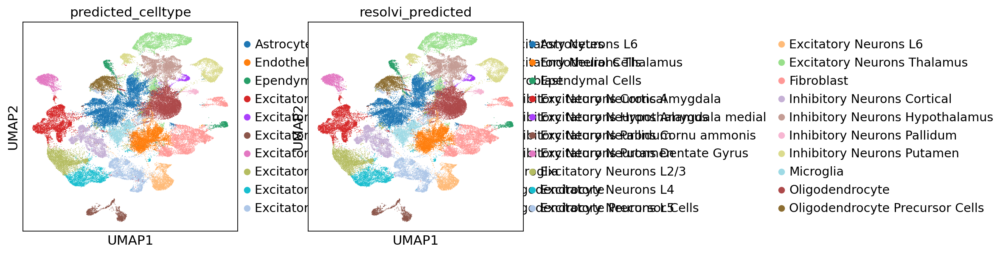

/tmp/ipykernel_1921283/2132712317.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(ref_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30)


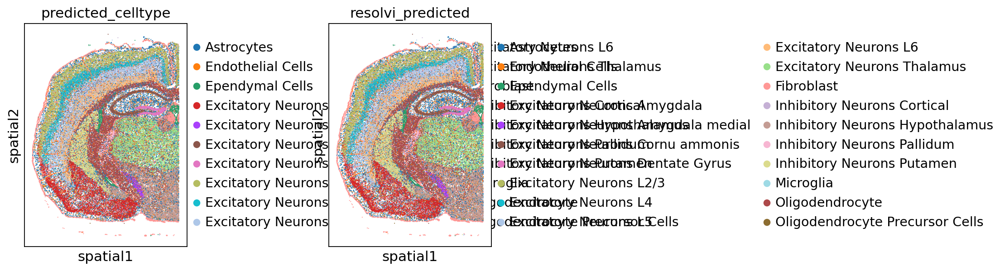

In [18]:
sc.pl.umap(ref_adata, color=["predicted_celltype", "resolvi_predicted"])
sc.pl.spatial(ref_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30)

## Graph DataLoader: Batch Structure & Spatial Quality

`ResolVI` trains with `GraphDataSplitter` by default.  Every mini-batch is a PyG `Data` object with:

| Field | Shape | Meaning |
|---|---|---|
| `x` | `[N, G]` | center-cell expression |
| `x_n` | `[N·K, G]` | neighbor expression (omitted when cache is active) |
| `edge_index` | `[2, N·K]` | center-to-neighbor-row edges |
| `edge_attr` | `[N·K, 1]` | flattened neighbor distances |
| `distances_n` | `[N, K]` | distance matrix (model-compatible alias) |

This structure is the foundation for future GNN-based message-passing variants.


In [19]:
from scviva.dataloaders import GraphDataLoader

adata_manager = scviva.model.ResolVI._get_most_recent_anndata_manager(ref_adata, required=True)

dl = GraphDataLoader(
    adata_manager,
    full_adata_manager=adata_manager,
    batch_size=64,
    shuffle=False,
)
batch = next(iter(dl))
print("Batch type:", type(batch).__name__)
print(f"  x  (center expression) : {tuple(batch.x.shape)}")
print(f"  x_n (neighbor expr.)   : {tuple(batch.x_n.shape)}")
print(f"  edge_index             : {tuple(batch.edge_index.shape)}")
print(f"  edge_attr (distances)  : {tuple(batch.edge_attr.shape)}")
print(f"  distances_n            : {tuple(batch.distances_n.shape)}")
n_cells, n_neighbors = batch.distances_n.shape
print(f"\n{n_cells} center cells × {n_neighbors} neighbors → {n_cells * n_neighbors} edges per batch")


Batch type: Data
  x  (center expression) : (64, 248)
  x_n (neighbor expr.)   : (640, 248)
  edge_index             : (2, 640)
  edge_attr (distances)  : (640, 1)
  distances_n            : (64, 10)

64 center cells × 10 neighbors → 640 edges per batch


We can use the trained model to perform differential expression of two groups of cells. We compute here genes differentially expressed between neurons in two distinct layers. This uses a similar test to the scVI DE test. Please keep in mind this test doesn't test for differences in the mean between two groups but tests for differences between random pairs of single cell.

In [20]:
de_result_importance = supervised_resolvi.differential_expression(
    ref_adata,
    groupby="resolvi_predicted",
    group1="Excitatory Neurons L6",
    group2="Excitatory Neurons L5",
    weights="importance",
    pseudocounts=1e-2,
    delta=0.05,
    filter_outlier_cells=True,
    mode="change",
    test_mode="three",
)
de_result_importance.head(5)

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note th

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
Tle4,0.9940,0.0060,5.109976,0.027469,0.006699,0.01,0.05,2.184786,2.238954,0.823769,...,7.964178,2.043863,0.979839,0.719224,260.476379,59.409416,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5
Foxp2,0.9938,0.0062,5.076985,0.012855,0.001213,0.01,0.05,3.712658,3.681135,1.447135,...,3.239149,0.402287,0.820565,0.261367,103.798050,11.409315,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5
Gadd45a,0.9896,0.0104,4.555494,0.016931,0.003656,0.01,0.05,2.294883,2.306565,0.886351,...,5.329896,1.191705,0.905645,0.518479,171.625336,33.211670,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5
Zfpm2,0.9840,0.0160,4.119037,0.005607,0.001630,0.01,0.05,1.918950,1.964219,0.810336,...,1.742364,0.392449,0.713710,0.268546,56.689106,10.936706,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5
Nell1,0.9758,0.0242,3.696905,0.000955,0.006622,0.01,0.05,-2.821684,-2.923234,1.136657,...,0.319758,2.601949,0.238710,0.642382,10.682412,68.107506,True,Excitatory Neurons L6 vs Excitatory Neurons L5,Excitatory Neurons L6,Excitatory Neurons L5


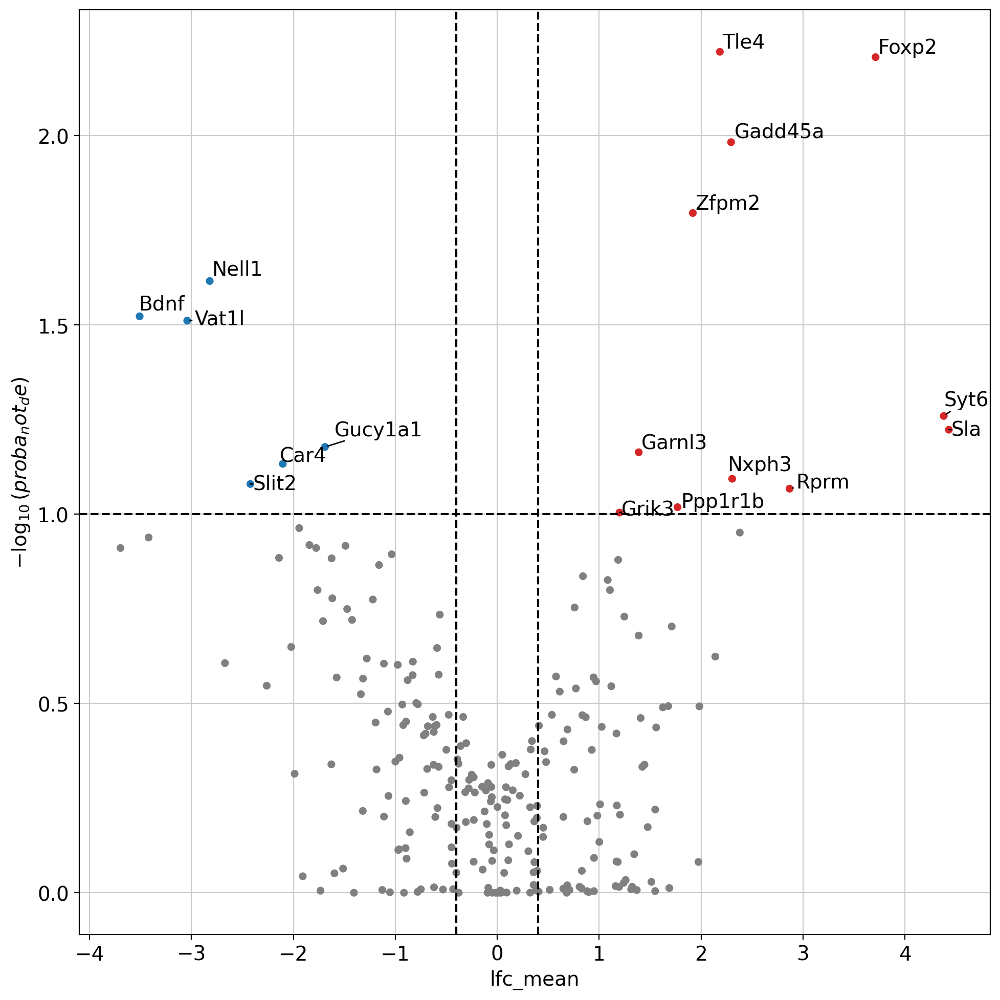

In [21]:
dc.pl.volcano(
    de_result_importance,
    x="lfc_mean",
    y="proba_not_de",
    thr_sign=0.1,
    thr_stat=0.4,
    top=30,
    figsize=(10, 10),
)
plt.show()

We can use the trained model to perform differential abundance of cell states in the neighborhood of two groups of cells. We find here that excitatory neurons in thalamus and cortex preferentially colocalize with themselves as well as adjacent layer neurons. This uses a similar test to the scVI DE test.

In [22]:
da = supervised_resolvi.differential_niche_abundance(
    groupby="resolvi_predicted",
    group1="Excitatory Neurons L4",
    group2="Excitatory Neurons Thalamus",
    neighbor_key="index_neighbor",
    test_mode="three",
    delta=0.05,
    pseudocounts=3e-2,
)
da.head(5)

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling local variables, batch:   0%|          | 0/21 [00:00<?, ?it/s]

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling local variables, batch:   0%|          | 0/32 [00:00<?, ?it/s]

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,is_de_fdr_0.05,comparison,group1,group2
Excitatory Neurons Thalamus,0.9954,0.0046,5.377086,0.001588,0.522286,0.03,0.05,-11.491468,-12.665426,2.953048,-14.954101,7.161288,True,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Excitatory Neurons L4,0.9948,0.0052,5.253881,0.485272,0.000261,0.03,0.05,11.405357,11.751500,1.898142,-6.441983,14.801873,True,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Excitatory Neurons L2/3,0.8364,0.1636,1.631682,0.077396,0.000066,0.03,0.05,7.690497,7.699586,3.426142,-5.749944,14.827776,False,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Excitatory Neurons L5,0.6796,0.3204,0.751934,0.055908,0.000222,0.03,0.05,6.205618,6.280560,4.223704,-7.475700,14.430895,False,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Oligodendrocyte,0.6636,0.3364,0.679379,0.018862,0.088296,0.03,0.05,-5.564602,-6.131032,6.104572,-14.408834,12.397362,False,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus


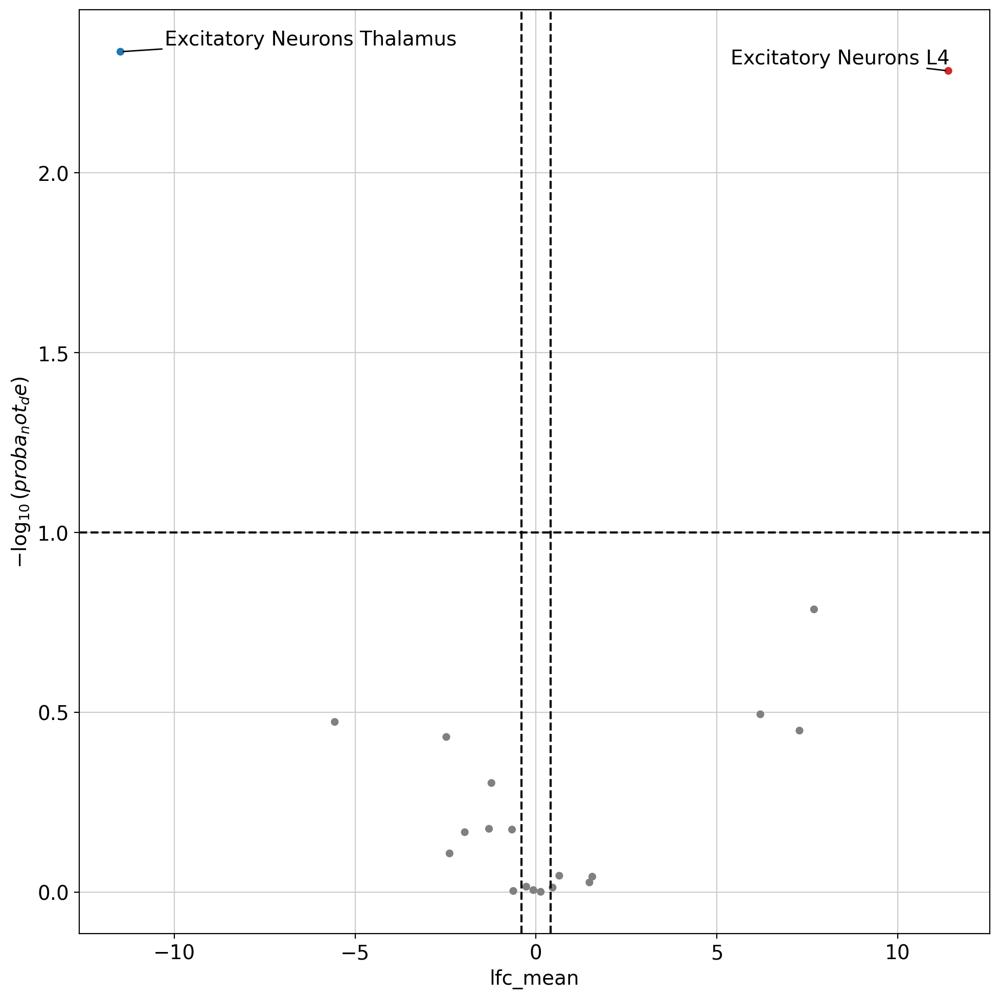

In [23]:
dc.pl.volcano(
    da,
    x="lfc_mean",
    y="proba_not_de",
    thr_sign=0.1,
    thr_stat=0.4,
    top=30,
    figsize=(10, 10),
)
plt.show()

We can also generate counts that are corrected for counts from neighboring cells wrongly assigned due to missegmentation as well as unspecific background. We use custom parameters for num_samples and and summary_fun to accelerate computation. "px_rate" of model_corrected generates corrected count data. "mixture_proportions" of model_residuals generates the amount of diffusion and background for each cell. Batch steps defines how many batches are accumulated before computing summary statistics.
To increase the amount of correction, use lower quantiles instead of median.

In [24]:
import pandas as pd

In [25]:
samples_corr = supervised_resolvi.sample_posterior(
    model=supervised_resolvi.module.model_corrected,
    return_sites=["px_rate"],
    summary_fun={"post_sample_q50": np.median},
    num_samples=3,
    summary_frequency=30,
)
samples_corr = pd.DataFrame(samples_corr).T

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling local variables, batch:   0%|          | 0/520 [00:00<?, ?it/s]

In [26]:
samples = supervised_resolvi.sample_posterior(
    model=supervised_resolvi.module.model_residuals,
    return_sites=["mixture_proportions"],
    summary_fun={"post_sample_means": np.mean},
    num_samples=3,
    summary_frequency=100,
)
samples = pd.DataFrame(samples).T

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling local variables, batch:   0%|          | 0/520 [00:00<?, ?it/s]

In [27]:
ref_adata.obs[["true_proportion", "diffusion_proportion", "background_proportion"]] = samples.loc[
    "post_sample_means", "mixture_proportions"
]

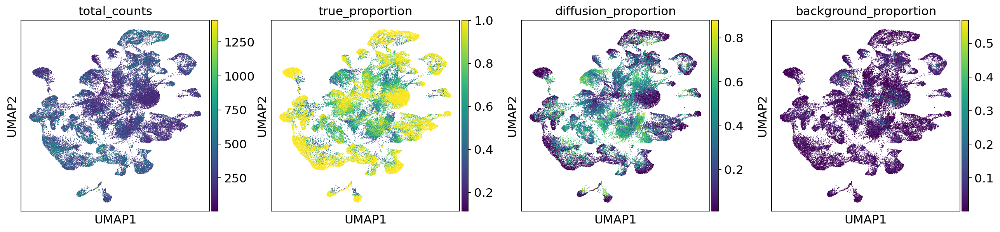

In [28]:
sc.pl.umap(
    ref_adata,
    color=["total_counts", "true_proportion", "diffusion_proportion", "background_proportion"],
)

In [29]:
ref_adata.layers["generated_expression"] = samples_corr.loc["post_sample_q50", "px_rate"]

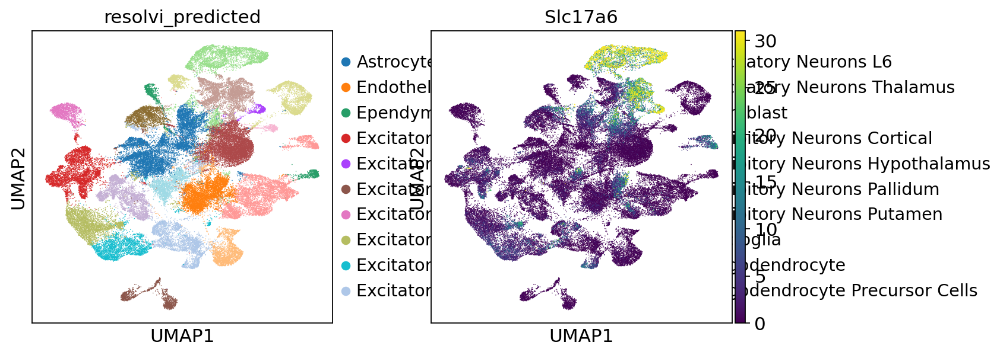

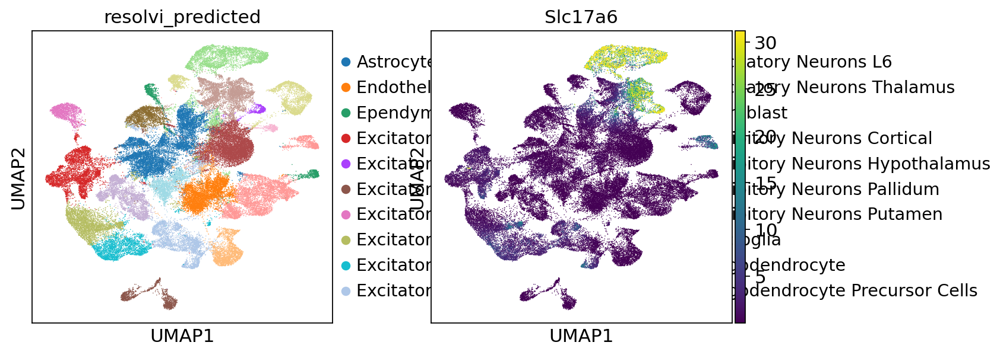

In [30]:
sc.pl.umap(ref_adata, color=["resolvi_predicted", "Slc17a6"], layer="counts", vmax="p98")
sc.pl.umap(
    ref_adata, color=["resolvi_predicted", "Slc17a6"], layer="generated_expression", vmax="p98"
)

## Query transfer
We can train the reference model on query data to reannotate this data. We rely on the observation names for non-amortized parameters in resolVI. It is important to make sure cells have unique names between query and reference dataset. We set the cell-type to unknown, so that resolVI needs to predict the celltype leveraging the reference model.

In [31]:
query_adata.obs["predicted_celltype"] = "unknown"
query_adata.obs_names = [f"query_{i}" for i in query_adata.obs_names]

In [32]:
supervised_resolvi.prepare_query_anndata(query_adata, reference_model=supervised_resolvi)
query_resolvi = supervised_resolvi.load_query_data(query_adata, reference_model=supervised_resolvi)

INFO     Found 100.0% reference vars in query data.                                                                


Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/home/access/miniconda3/lib/python3.13/site-packages/scvi/data/fields/_dataframe_field.py:227: UserWarning: Category 66457 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(


In [33]:
query_resolvi.train(
    max_epochs=20,
    datasplitter_kwargs={"neighbor_indices_key": "index_neighbor"},
    cache_neighbor_expression="auto",
)

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
/home/access/miniconda3/lib/python3.13/site-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Running transfer learning mode. Set lr to 0 and blocking variables.


/home/access/miniconda3/lib/python3.13/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/home/access/miniconda3/lib/python3.13/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/home/access/miniconda3/lib/python3.13/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 52 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If this is intentional, you can ignore this warning.


Training:   0%|          | 0/20 [00:00<?, ?it/s]

2026-05-07 19:47:16 | [INFO] Guessed max_plate_nesting = 2
`Trainer.fit` stopped: `max_epochs=20` reached.


In [34]:
query_adata.obs["resolvi_predicted"] = query_resolvi.predict(
    query_adata, num_samples=3, soft=False
)
query_adata.obsm["X_resolVI"] = query_resolvi.get_latent_representation(query_adata)

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling local variables, batch:   0%|          | 0/129 [00:00<?, ?it/s]

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Again, we may visualize the latent space as well as the inferred labels

In [35]:
rsc.pp.neighbors(query_adata, use_rep="X_resolVI")
rsc.tl.umap(query_adata)

... storing 'predicted_celltype' as categorical
... storing 'resolvi_predicted' as categorical


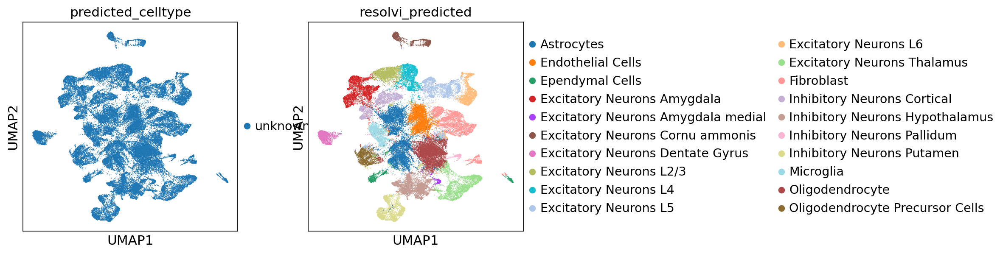

/tmp/ipykernel_1921283/1669651559.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(query_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30)


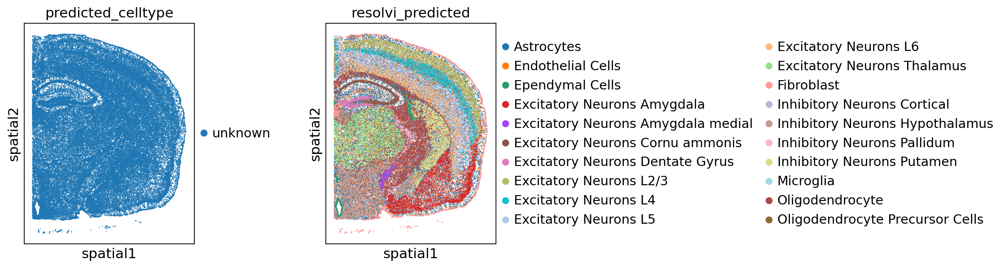

In [36]:
sc.pl.umap(query_adata, color=["predicted_celltype", "resolvi_predicted"])
sc.pl.spatial(query_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30)

We can now concatenate the datasets again and find good integration and accurate cell-type information.

In [37]:
full_adata = ref_adata.concatenate(
    query_adata, batch_key="source", batch_categories=["reference", "query"]
)

/tmp/ipykernel_1921283/1142808005.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  full_adata = ref_adata.concatenate(


In [38]:
rsc.pp.neighbors(full_adata, use_rep="X_resolVI")
rsc.tl.umap(full_adata)

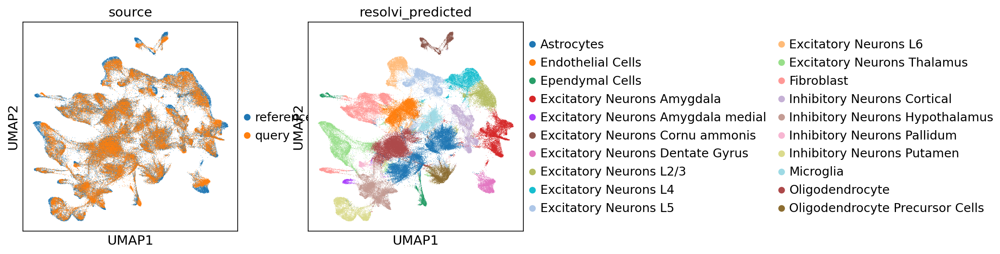

/tmp/ipykernel_1921283/3452622550.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(full_adata, color=["source", "resolvi_predicted"], spot_size=30)


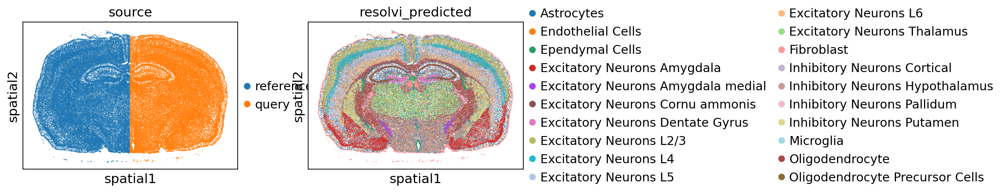

In [39]:
sc.pl.umap(full_adata, color=["source", "resolvi_predicted"])
sc.pl.spatial(full_adata, color=["source", "resolvi_predicted"], spot_size=30)

### scib_rapids Metrics: GraphDataLoader vs AnnDataLoader

`scib_rapids` provides RAPIDS-backed versions of the standard scIB biological and batch metrics.  
Here we compare the graph-trained ResolVI embedding against a quick AnnDataLoader baseline with the same metric set used by the default scIB benchmarker: isolated labels, KMeans NMI/ARI, silhouette label, cLISI, BRAS, iLISI, KBET, graph connectivity, and PCR comparison.

The new spatial metric groups (`CoordinatePreservation`, `NichePreservation`, and `DomainBoundary`) are not in `scib_rapids` yet, so this section intentionally reports only the RAPIDS-backed bio/batch metrics.

This section is placed after the DE, posterior sampling, and query-transfer cells because the AnnDataLoader baseline trains a second ResolVI model. ResolVI stores parameters in Pyro's global param store, so training another ResolVI model before downstream reference-model calls can invalidate `supervised_resolvi`.


In [40]:
import os

os.environ.setdefault("NUMBA_CACHE_DIR", "/tmp/numba")

import numpy as np
import pandas as pd
import scipy.sparse as sp
import scib_rapids as scib_rp
from scib_rapids.nearest_neighbors import pynndescent


def _dense_float32(matrix):
    if sp.issparse(matrix):
        matrix = matrix.toarray()
    return np.asarray(matrix, dtype=np.float32)


def _label_has_multiple_batches(labels, batches):
    pairs = pd.DataFrame({"label": labels, "batch": batches})
    return bool((pairs.groupby("label", observed=True)["batch"].nunique() > 1).any())


def _safe_scalar(name, fn, *args, **kwargs):
    try:
        value = fn(*args, **kwargs)
        if value is None:
            return np.nan
        return float(value)
    except Exception as exc:
        print(f"{name}: skipped ({type(exc).__name__}: {exc})")
        return np.nan


def scib_rapids_metric_table(
    adata,
    embedding_keys,
    label_key,
    batch_key,
    pre_integrated_key=None,
    n_neighbors=90,
    n_jobs=-1,
):
    labels = adata.obs[label_key].to_numpy()
    batches = adata.obs[batch_key].to_numpy()
    n_batches = pd.Series(batches).nunique()
    has_multi_batch_label = _label_has_multiple_batches(labels, batches)
    x_pre = _dense_float32(adata.obsm[pre_integrated_key]) if pre_integrated_key else None

    rows = []
    for key in embedding_keys:
        x_emb = _dense_float32(adata.obsm[key])
        k_max = min(n_neighbors, x_emb.shape[0] - 1)
        neighbors = pynndescent(x_emb, n_neighbors=k_max, random_state=0, n_jobs=n_jobs)

        try:
            nmi_ari = scib_rp.nmi_ari_cluster_labels_kmeans(x_emb, labels)
            nmi = float(nmi_ari.get("nmi", np.nan))
            ari = float(nmi_ari.get("ari", np.nan))
        except Exception as exc:
            print(f"KMeans NMI/ARI: skipped ({type(exc).__name__}: {exc})")
            nmi = ari = np.nan

        row = {
            "Embedding": key,
            "Isolated labels": _safe_scalar(
                "Isolated labels", scib_rp.isolated_labels, x_emb, labels, batches
            ),
            "KMeans NMI": nmi,
            "KMeans ARI": ari,
            "Silhouette label": _safe_scalar(
                "Silhouette label", scib_rp.silhouette_label, x_emb, labels
            ),
            "cLISI": _safe_scalar(
                "cLISI", scib_rp.clisi_knn, neighbors.subset_neighbors(min(90, k_max)), labels
            ),
            "BRAS": _safe_scalar("BRAS", scib_rp.bras, x_emb, labels, batches)
            if has_multi_batch_label
            else np.nan,
            "iLISI": _safe_scalar(
                "iLISI", scib_rp.ilisi_knn, neighbors.subset_neighbors(min(90, k_max)), batches
            )
            if n_batches > 1
            else np.nan,
            "KBET": _safe_scalar(
                "KBET",
                scib_rp.kbet_per_label,
                neighbors.subset_neighbors(min(50, k_max)),
                batches,
                labels,
            )
            if has_multi_batch_label
            else np.nan,
            "Graph connectivity": _safe_scalar(
                "Graph connectivity",
                scib_rp.graph_connectivity,
                neighbors.subset_neighbors(min(15, k_max)),
                labels,
            ),
            "PCR comparison": _safe_scalar(
                "PCR comparison", scib_rp.pcr_comparison, x_pre, x_emb, batches, categorical=True
            )
            if x_pre is not None and n_batches > 1
            else np.nan,
        }
        rows.append(row)

    return pd.DataFrame(rows).set_index("Embedding")


In [41]:
import warnings

from scvi.dataloaders import DataSplitter


class ResolVILegacy(scviva.model.ResolVI):
    """ResolVI with the classic AnnDataLoader path, used only for comparison."""

    _data_splitter_cls = DataSplitter


adata_ann = ref_adata.copy()
ResolVILegacy.setup_anndata(adata_ann, labels_key="predicted_celltype", layer="counts")
model_ann = ResolVILegacy(adata_ann, semisupervised=False)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    model_ann.train(max_epochs=10, enable_progress_bar=False)
latent_ann = model_ann.get_latent_representation(adata_ann)


INFO     Generating sequential column names                                                                        
INFO     Generating sequential column names                                                                        


/home/access/miniconda3/lib/python3.13/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
2026-05-07 19:48:57 | [INFO] Guessed max_plate_nesting = 2
`Trainer.fit` stopped: `max_epochs=10` reached.
Trainer

In [42]:
benchmark_adata = ref_adata.copy()
benchmark_adata.obsm["X_resolVI_graph"] = ref_adata.obsm["X_resolVI"]
benchmark_adata.obsm["X_resolVI_ann"] = latent_ann
benchmark_adata.obsm["X_pre"] = _dense_float32(benchmark_adata.X)
benchmark_adata.obs["scib_labels"] = benchmark_adata.obs["predicted_celltype"].astype("category")
benchmark_adata.obs["scib_batch"] = benchmark_adata.obs["fov"].astype("category")


In [43]:
resolvi_rapids_results = scib_rapids_metric_table(
    benchmark_adata,
    embedding_keys=["X_resolVI_graph", "X_resolVI_ann"],
    label_key="scib_labels",
    batch_key="scib_batch",
    pre_integrated_key="X_pre",
)
resolvi_rapids_results


2026-05-07 19:49:35 | [INFO] isolated labels: no more than 1 batches per label
/home/access/miniconda3/lib/python3.13/site-packages/scib_rapids/metrics/_graph_connectivity.py:33: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
2026-05-07 19:49:41 | [INFO] isolated labels: no more than 1 batches per label
/home/access/miniconda3/lib/python3.13/site-packages/scib_rapids/metrics/_graph_connectivity.py:33: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)


,Isolated labels,KMeans NMI,KMeans ARI,Silhouette label,cLISI,BRAS,iLISI,KBET,Graph connectivity,PCR comparison
Embedding,,,,,,,,,,
X_resolVI_graph,0.701282,0.847891,0.797747,0.669041,1.0,NaN,NaN,NaN,0.982073,NaN
X_resolVI_ann,0.666815,0.752295,0.601823,0.623222,1.0,NaN,NaN,NaN,0.948270,NaN


In [44]:
print(f"{time.perf_counter() - start:.3f}s")

429.656s
